# LSTM & GRU

In [1]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split
from IPython.display import Image

## 定义输入数据
假设输入样本数量为1000，每个样本的特征数量为15，每个小批量中时间步数为10，批量大小为64，同时，每个样本都对应一个标量标签。<br><br>
输入的形状：如果batch_first为False，那么输入形状为(seq_len, batch_size, input_size)，True则为(batch_size, seq_len, input_size）

In [2]:
# seq_len表示时间步数，batch_size表示批量的大小，input_size表示每个时间步的输入特征的维度。
seq_len = 10
sample_size = 1000
features = 15
BATCH_SIZE = 64
X = torch.randn(seq_len, sample_size, features)  # (seq_len, batch_size, input_size)
y = torch.randn(seq_len, sample_size, 1) 
X = X.permute(1, 0, 2)
y = y.permute(1, 0, 2)
torch_dataset = TensorDataset(X, y)
train_size = int(sample_size * 0.8)
test_size = sample_size - train_size
trainset, testset = random_split(torch_dataset, [train_size, test_size])
trainloader = DataLoader(dataset=trainset,      
                         batch_size=BATCH_SIZE,      
                         shuffle=True,               
                         num_workers=2) 

In [3]:
for x in trainloader:
    print(x)
    break

[tensor([[[ 0.4540,  2.0505,  1.8005,  ...,  0.4042, -1.7250,  1.0350],
         [-0.8664, -1.3743, -0.0184,  ..., -1.0852,  0.1087,  0.7777],
         [-0.0795,  0.2301, -2.6513,  ...,  0.4672,  1.5841,  1.0589],
         ...,
         [ 0.0163,  0.2077, -0.9056,  ..., -0.8597, -1.1141,  0.1540],
         [ 0.4538,  1.9588,  1.0234,  ..., -0.3064, -0.1393,  2.9072],
         [-0.0232,  2.0684, -0.3065,  ...,  0.2909,  1.0892,  1.1136]],

        [[ 0.1901,  0.3496,  0.1059,  ...,  2.3296,  1.1058, -1.9532],
         [-0.6137, -0.1424, -0.8775,  ...,  0.2460,  0.9742, -0.5776],
         [ 2.4492,  1.1111, -0.1209,  ...,  1.4041,  0.7044,  0.9197],
         ...,
         [ 1.1801,  1.4396,  0.1354,  ...,  1.1290,  0.3494,  0.7535],
         [-0.2014, -0.5187,  0.9556,  ...,  0.2538,  0.5075,  0.3611],
         [ 1.1014,  0.0194, -1.2717,  ...,  0.9697, -0.0345,  0.2379]],

        [[-0.6724,  1.5309, -0.9318,  ...,  0.8211, -0.0582, -0.6883],
         [-0.0387,  0.2154, -0.2574,  ..., -

In [4]:
x[0].shape, x[1].shape

(torch.Size([64, 10, 15]), torch.Size([64, 10, 1]))

## [使用nn.LSTM构造长短期记忆网络](https://pytorch.org/docs/stable/generated/torch.nn.LSTM.html#torch.nn.LSTM)

tensor.detach()方法用于返回一个新的Tensor，这个Tensor和原来的Tensor共享相同的内存空间，但是不会被计算图所追踪，也就是说它不会参与反向传播，不会影响到原有的计算图

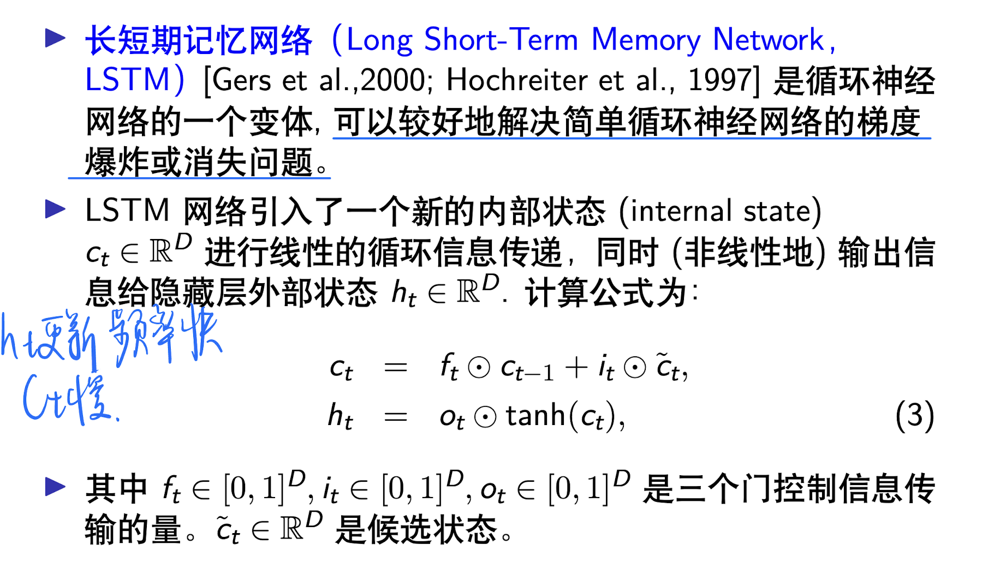

In [2]:
Image(filename='./data/LSTM_1.png')

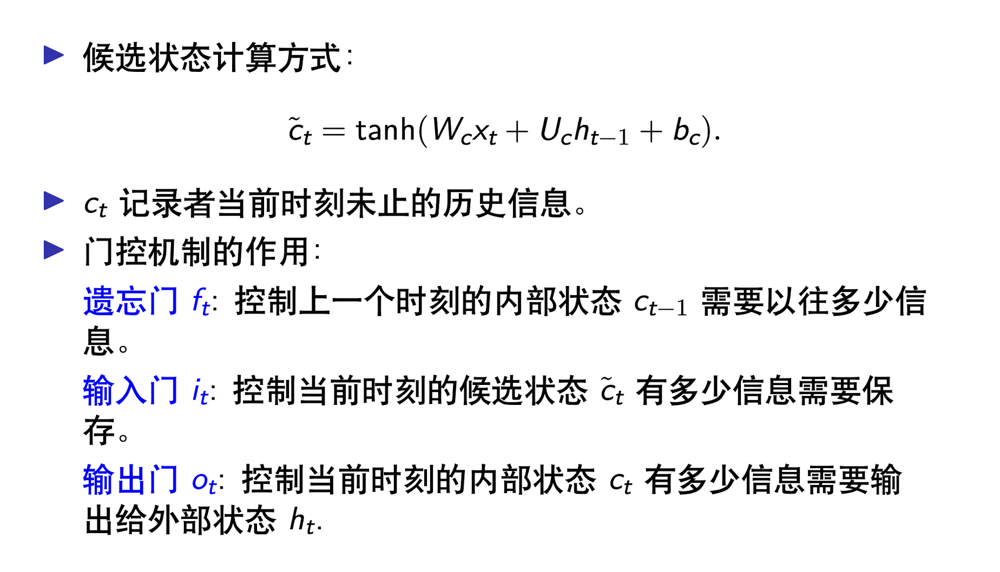

In [3]:
Image(filename='./data/LSTM_2.png')

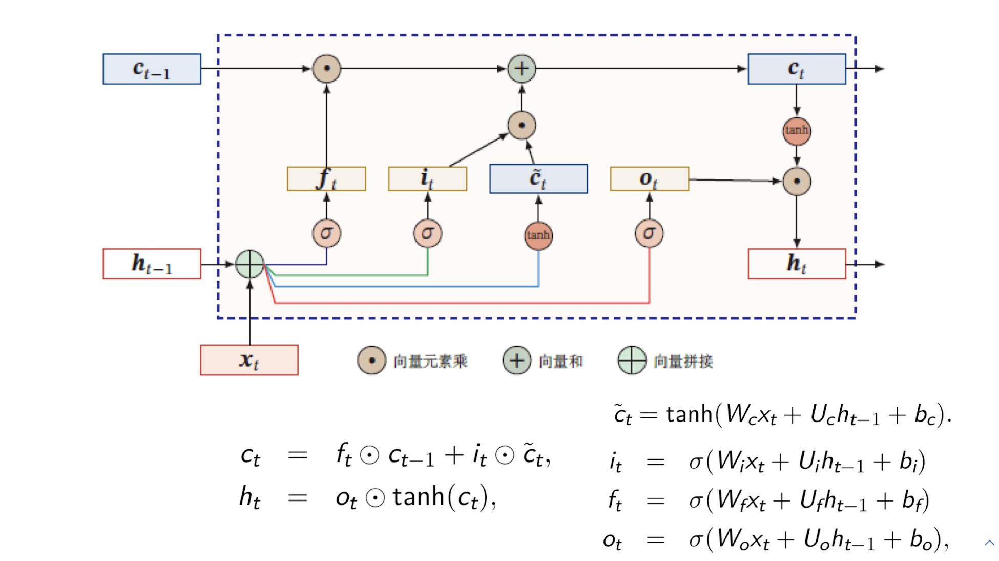

In [6]:
Image(filename='./data/LSTM_3.png')

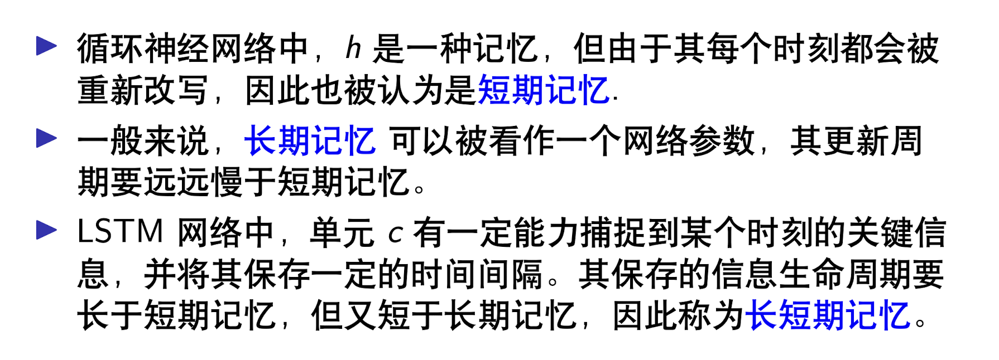

In [8]:
Image(filename='./data/LSTM_4.png')

### 定义LSTM

In [27]:
class LSTM(nn.Module):
    def __init__(self, 
                 input_size, 
                 hidden_size, 
                 output_size, 
                 num_layers: int=1, 
                 bias: bool=True, 
                 batch_first: bool=False, 
                 dropout: float=0,
                 bidirectional: bool=False,
                 proj_size: int=0):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size=input_size, 
                            hidden_size=hidden_size, 
                            num_layers=num_layers, 
                            bias=bias, 
                            batch_first=batch_first,
                            dropout=dropout,
                            bidirectional=bidirectional,
                            proj_size=proj_size)
        # 使用这一步，我们可以自定义输出形状output_size
        self.fc = nn.Linear(hidden_size, output_size)
        
    def forward(self, x):
        # 这里如果不提供h0，那么会默认使用zero tensor作为h0
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).requires_grad_()
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).requires_grad_()
        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))
        out = self.fc(out)
        return out, (hn, cn)

### 定义一些参数并初始化模型

In [25]:
BATCH_SIZE = 64
seq_len = 30
features = 40
sample_size = 1000
learning_rate = 0.01
num_epochs = 100
loss = nn.MSELoss()
lstm = LSTM(input_size=features, hidden_size=128, output_size=1, batch_first=True)
optim = torch.optim.Adam(lstm.parameters(), lr=learning_rate)

### 训练模型

Epoch [10/100], Loss: 0.2422
Epoch [20/100], Loss: 0.0581
Epoch [30/100], Loss: 0.0343
Epoch [40/100], Loss: 0.0318
Epoch [50/100], Loss: 0.0218
Epoch [60/100], Loss: 0.0228
Epoch [70/100], Loss: 0.0220
Epoch [80/100], Loss: 0.0191
Epoch [90/100], Loss: 0.0177
Epoch [100/100], Loss: 0.0169


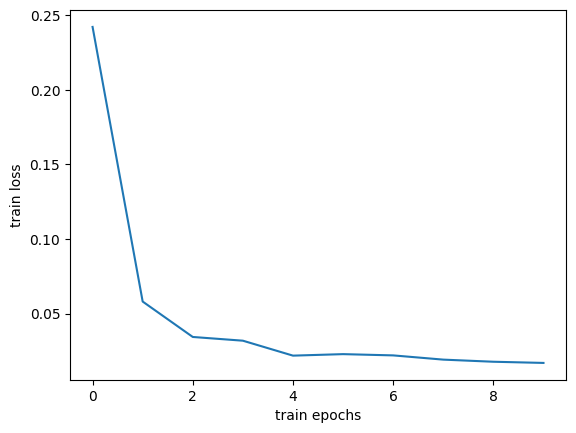

In [26]:
# 训练模型
idx = 0
loss_list = []
for epoch in range(num_epochs):
    for step, (inputs, targets) in enumerate(trainloader):  # 每一步 loader 释放一小批数据用来学习
        optim.zero_grad()
        
        output_tensor, _ = lstm(inputs)
        l = loss(output_tensor, targets)
        
        l.backward()
        optim.step()
        
    if (epoch + 1) % 10 == 0:
        idx += 1
        loss_list.append(l)
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {l.item():.4f}")

with torch.no_grad():
# plot the train loss    
    plt.plot(np.arange(idx), np.array(loss_list))
    plt.xlabel('train epochs')
    plt.ylabel('train loss')
    plt.show()

### 模型在测试集上的表现

In [ ]:
# 先将test_dataset逆转换为tensor的格式
with torch.no_grad():
    test_data_x = [x[0] for x in testset]
    test_data_y = [x[1] for x in testset]
    test_data_x = torch.stack(test_data_x, dim=0)
    test_data_y = torch.stack(test_data_y, dim=0)

In [ ]:
with torch.no_grad():
    lstm_output = lstm(test_data_x)[0]
    l = loss(lstm_output, test_data_y)
    print(f'Test loss is {l}')

Test loss is 1.6294636726379395


## [使用GRU(门控神经单元)](https://pytorch.org/docs/stable/generated/torch.nn.GRU.html#torch.nn.GRU)

在pytorch中，GRU的实现方式和LSTM几乎一致，最大的区别在于GRU中不包含候选状态ct

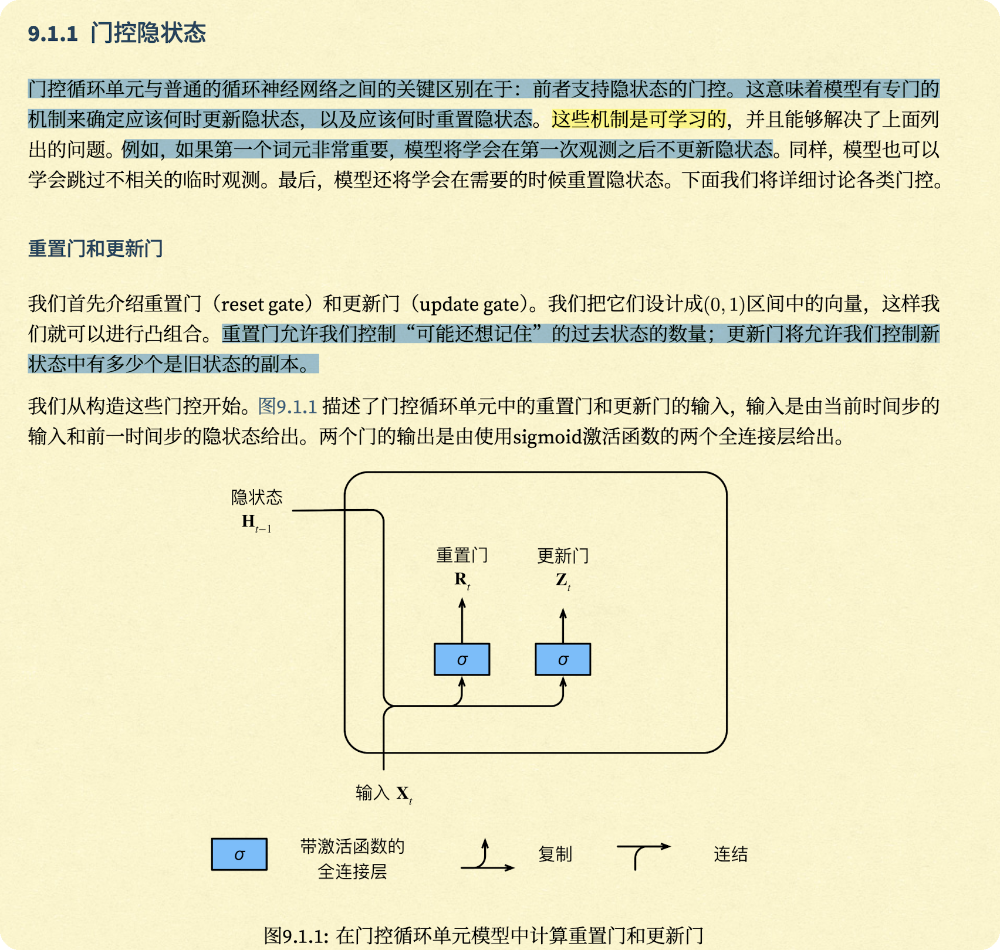

In [10]:
Image(filename='./data/GRU_1.png')

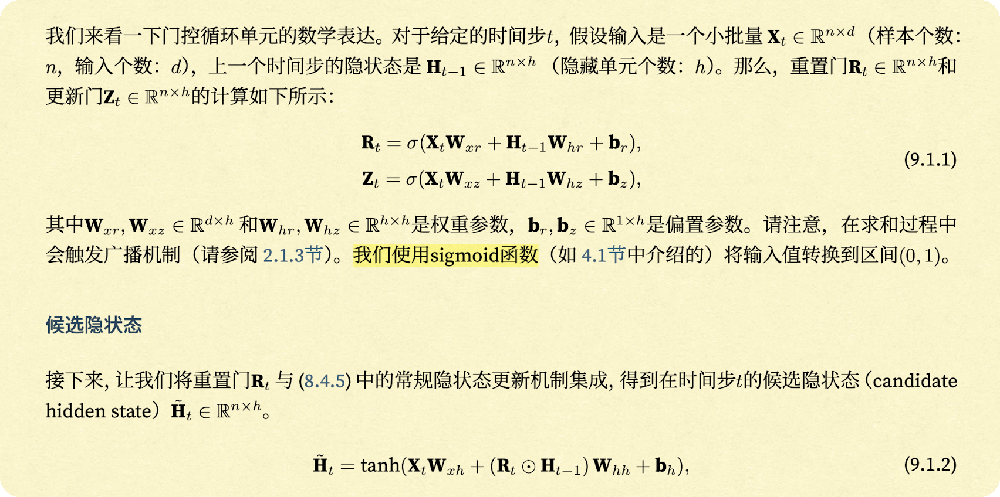

In [11]:
Image(filename='./data/GRU_2.png')

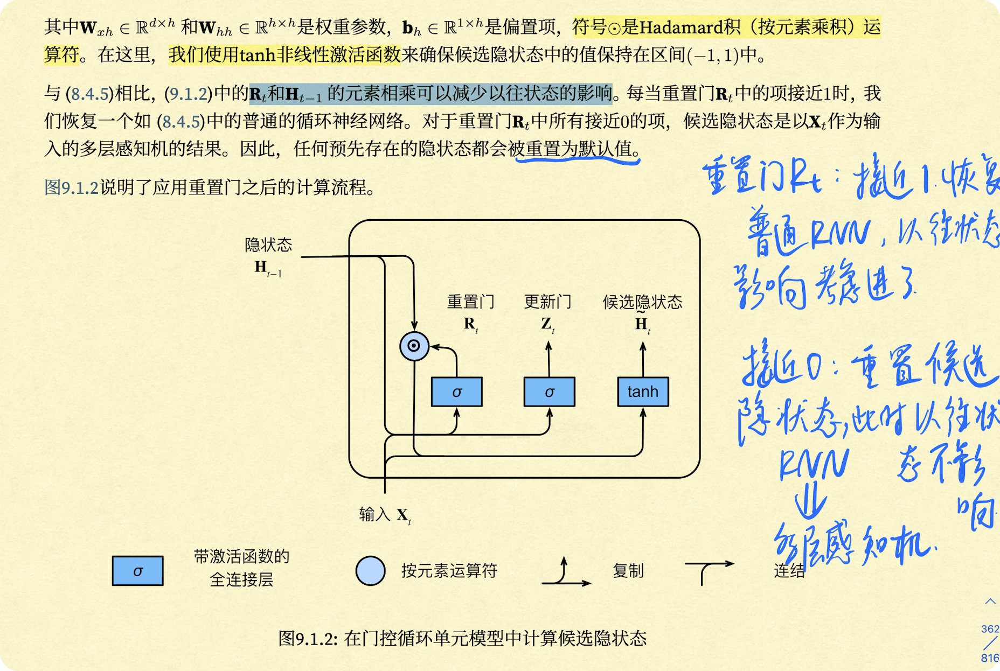

In [13]:
Image(filename='./data/GRU_3.png')

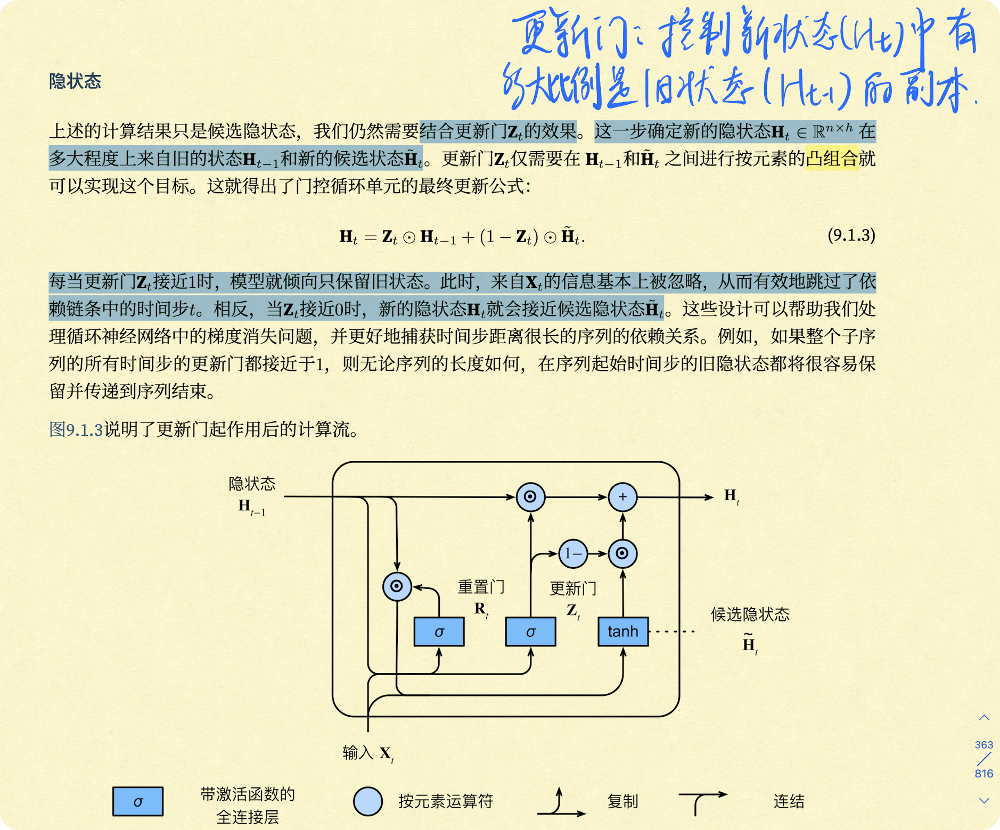

In [14]:
Image(filename='./data/GRU_4.png')

### 定义GRU

In [46]:
class GRU(nn.Module):
    def __init__(self, 
                 input_size, 
                 hidden_size, 
                 output_size, 
                 num_layers: int=1, 
                 bias: bool=True, 
                 batch_first: bool=False, 
                 dropout: float=0,
                 bidirectional: bool=False):
        super(GRU, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.gru = nn.GRU(input_size=input_size, 
                          hidden_size=hidden_size, 
                          num_layers=num_layers, 
                          bias=bias, 
                          batch_first=batch_first,
                          dropout=dropout,
                          bidirectional=bidirectional)
        # 使用这一步，我们可以自定义输出形状output_size
        self.fc = nn.Linear(hidden_size, output_size)
        
    def forward(self, x):
        # 这里如果不提供h0，那么会默认使用zero tensor作为h0
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).requires_grad_()
        out, hn = self.gru(x, h0.detach())
        out = self.fc(out)
        return out, hn

In [41]:
inputs.shape

torch.Size([64, 30, 40])

### 定义一些参数并初始化模型

In [48]:
BATCH_SIZE = 64
seq_len = 30
features = 40
sample_size = 1000
learning_rate = 0.01
num_epochs = 100
loss = nn.MSELoss()
gru = GRU(input_size=features, hidden_size=128, output_size=1, batch_first=True)
optim = torch.optim.Adam(gru.parameters(), lr=learning_rate)

### 训练模型

Epoch [10/100], Loss: 0.3580
Epoch [20/100], Loss: 0.1204
Epoch [30/100], Loss: 0.0780
Epoch [40/100], Loss: 0.0581
Epoch [50/100], Loss: 0.0602
Epoch [60/100], Loss: 0.0508
Epoch [70/100], Loss: 0.0483
Epoch [80/100], Loss: 0.0553
Epoch [90/100], Loss: 0.0513
Epoch [100/100], Loss: 0.0651


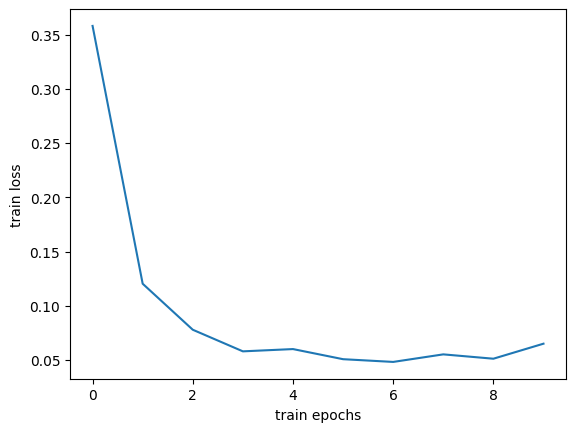

In [49]:
# 训练模型
idx = 0
loss_list = []
for epoch in range(num_epochs):  
    for step, (inputs, targets) in enumerate(trainloader):  # 每一步 loader 释放一小批数据用来学习
        optim.zero_grad()
        
        output_tensor, _ = gru(inputs)
        l = loss(output_tensor, targets)
        
        l.backward()
        optim.step()
        
    if (epoch + 1) % 10 == 0:
        idx += 1
        loss_list.append(l)
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {l.item():.4f}")

with torch.no_grad():
# plot the train loss    
    plt.plot(np.arange(idx), np.array(loss_list))
    plt.xlabel('train epochs')
    plt.ylabel('train loss')
    plt.show()

### 模型在测试集上的表现

In [50]:
# 先将test_dataset逆转换为tensor的格式
with torch.no_grad():
    test_data_x = [x[0] for x in testset]
    test_data_y = [x[1] for x in testset]
    test_data_x = torch.stack(test_data_x, dim=0)
    test_data_y = torch.stack(test_data_y, dim=0)

In [51]:
with torch.no_grad():
    lstm_output = lstm(test_data_x)[0]
    l = loss(lstm_output, test_data_y)
    print(f'Test loss is {l}')

Test loss is 1.5890101194381714


## 参考链接

[nn.LSTM](https://pytorch.org/docs/stable/generated/torch.nn.LSTM.html#torch.nn.LSTM)<br>
[nn.GRU](https://pytorch.org/docs/stable/generated/torch.nn.GRU.html#torch.nn.GRU)<br>
[LSTM输入形状](https://blog.csdn.net/weixin_42887138/article/details/122323092)<br>
[LSTM不一定在每个时间步都需要计算一个损失](https://www.zhihu.com/question/494286220)。根据具体问题，如果每组时间步只有最后一个时间步具有标签，那么可以只计算最后一个时间步的输出，并且和标签比对，输出一个损失。例如，输入样本形状为(batch, seq_len, feature)，则LSTM的每个时间步都输入一个大小为(batch, feature)的样本。<br><br>这点其实是RNN不同模式的区别，具体见深度学习课件。